In [ ]:
# Intelligent Traffic Monitoring and Analysis System using YOLO and OpenCV

## Step 1: Problem Definition
# Computer vision significantly enhances traffic management systems by enabling automated, real-time analysis of road conditions.
# Through techniques like object detection and motion tracking, it can identify and count vehicles, estimate traffic density,
# and even detect irregular patterns such as sudden congestion or accidents.

In [ ]:
## Step 2: Data Collection
import cv2

video_path = "traffic_video.mp4"
cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    print("❌ Error: Could not open video.")
else:
    print("✅ Video loaded successfully.")
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    fps = cap.get(cv2.CAP_PROP_FPS)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    print(f"Total Frames: {frame_count}")
    print(f"FPS: {fps}")
    print(f"Resolution: {width}x{height}")


✅ Video loaded successfully.
Total Frames: 687
FPS: 25.0
Resolution: 640x360


In [ ]:
# Step 3: Exploratory Data Analysis (EDA)
import matplotlib.pyplot as plt
!pip install ultralytics
from ultralytics import YOLO

model = YOLO("yolov8n.pt")
vehicle_classes = ['car', 'truck', 'bus', 'motorcycle']
density_over_time = []

cap = cv2.VideoCapture(video_path)
frame_interval = 5
frame_number = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
    if frame_number % frame_interval == 0:
        results = model(frame, verbose=False)[0]
        count = 0
        for r in results.boxes:
            cls_id = int(r.cls)
            label = model.names[cls_id]
            if label in vehicle_classes:
                count += 1
        density_over_time.append(count)
    frame_number += 1
cap.release()

plt.figure(figsize=(12, 5))
plt.plot(range(0, len(density_over_time)*frame_interval, frame_interval), density_over_time, color='blue')
plt.title("Traffic Density Over Time")
plt.xlabel("Frame Number")
plt.ylabel("Vehicle Count")
plt.grid(True)
plt.show()

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 19.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 70.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 55.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 38.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 787.7 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 81.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

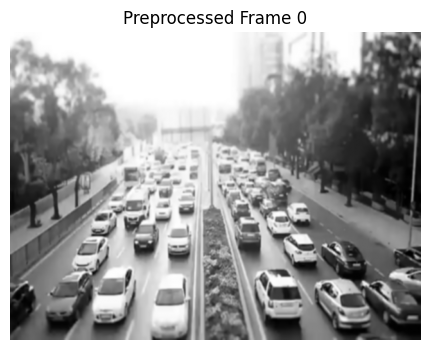

In [5]:
## Step 4: Video Preprocessing
def preprocess_frame(frame):
    frame = cv2.resize(frame, (640, 480))
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    frame = cv2.GaussianBlur(frame, (5, 5), 0)
    return frame

cap = cv2.VideoCapture(video_path)
frames = []
for i in range(10):
    ret, frame = cap.read()
    if not ret:
        break
    preprocessed = preprocess_frame(frame)
    frames.append(preprocessed)
cap.release()

plt.figure(figsize=(6, 4))
plt.imshow(frames[0], cmap='gray')
plt.title("Preprocessed Frame 0")
plt.axis('off')
plt.show()

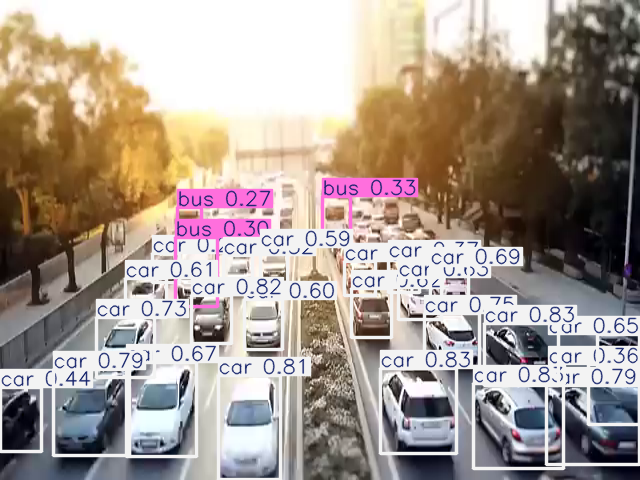

In [6]:
## Step 5: Feature Engineering - Vehicle Detection
cap = cv2.VideoCapture(video_path)
ret, frame = cap.read()
cap.release()
frame = cv2.resize(frame, (640, 480))
results = model(frame)
results[0].show()


In [7]:
## Step 6: Model Training and Analysis
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import numpy as np

X = np.array(density_over_time).reshape(-1, 1)
y = np.where(X < 10, 0, np.where(X < 20, 1, 2)).ravel()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
clf = LogisticRegression()
clf.fit(X_train, y_train)
accuracy = clf.score(X_test, y_test)
print(f"✅ Traffic Density Classifier Accuracy: {accuracy * 100:.2f}%")


✅ Traffic Density Classifier Accuracy: 100.00%


Processing video... This might take some time depending on video length and model complexity.
Displaying frame 30...


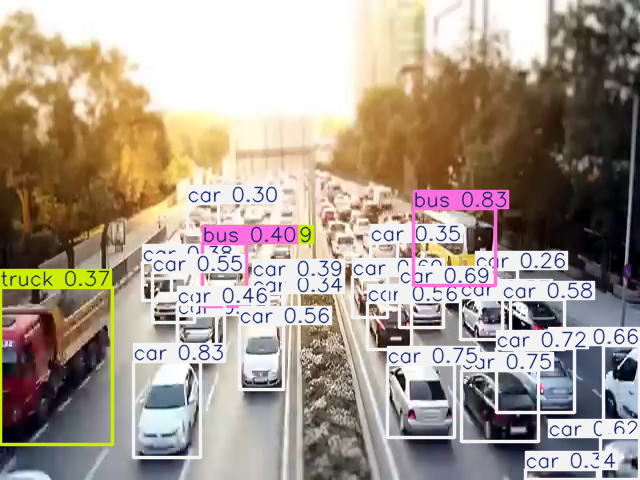

Displaying frame 60...


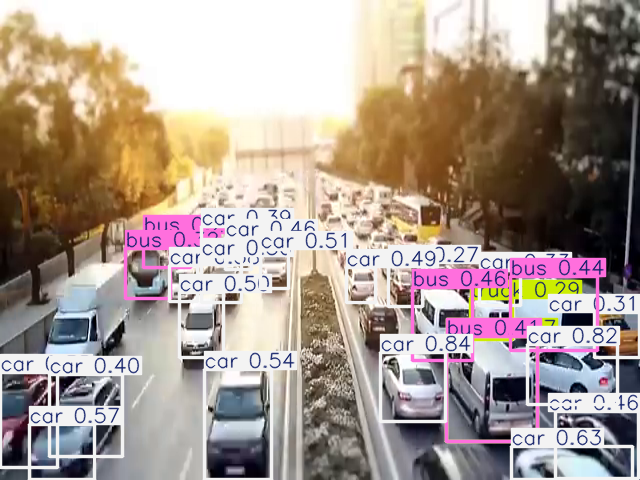

Displaying frame 90...


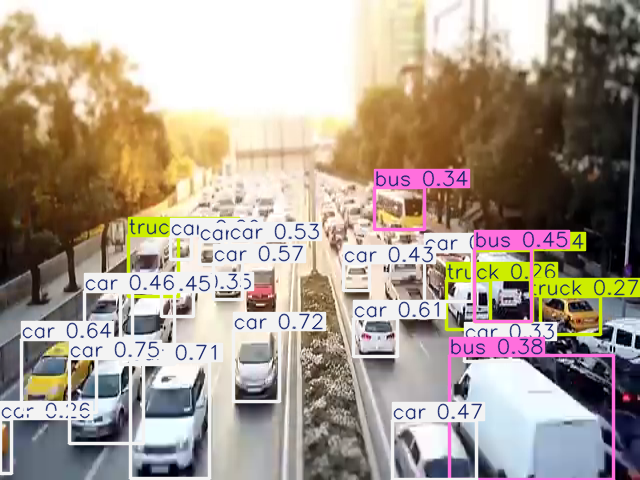

Displaying frame 120...


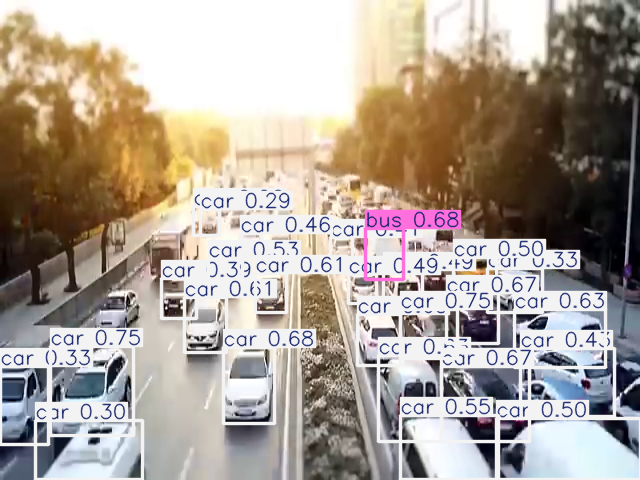

Displaying frame 150...


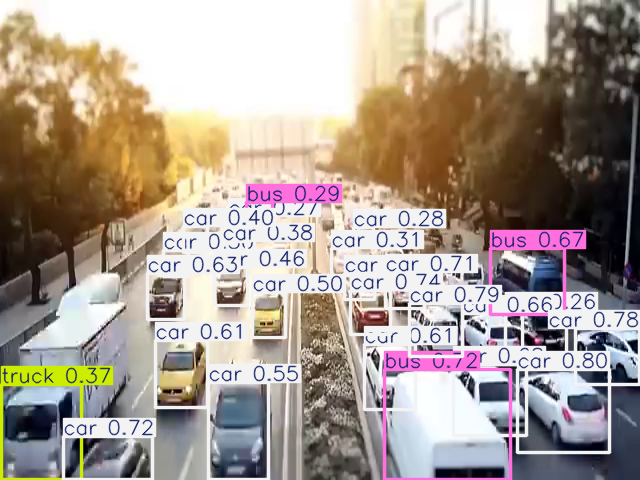

Displaying frame 180...


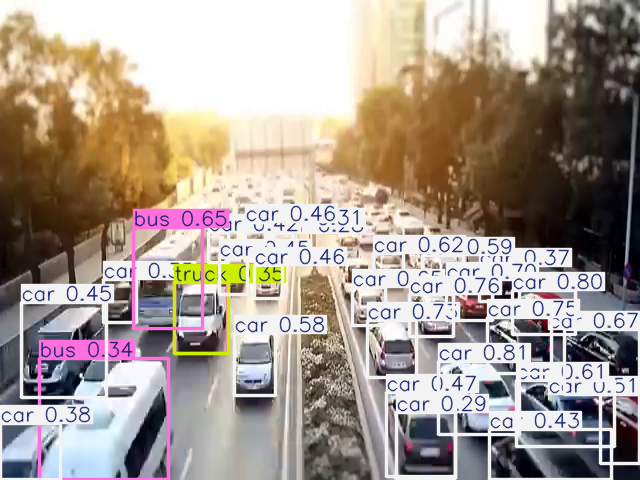

Displaying frame 210...


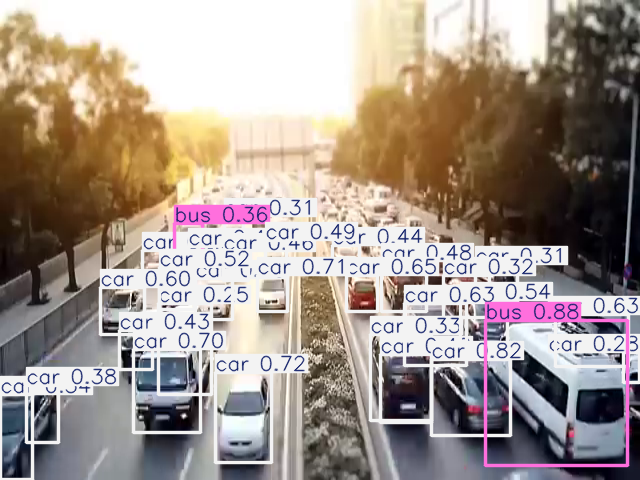

Displaying frame 240...


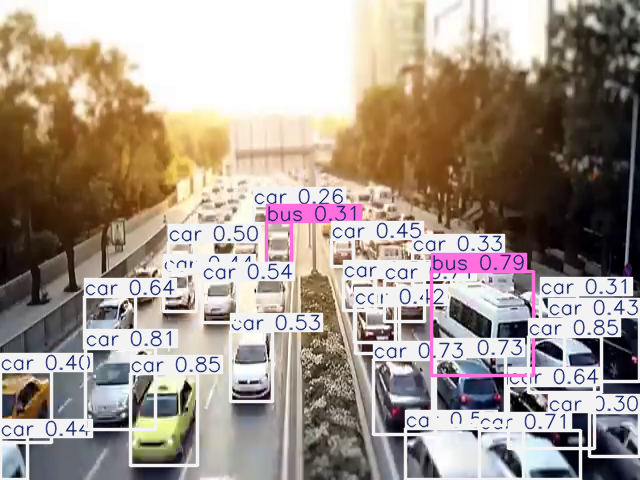

Displaying frame 270...


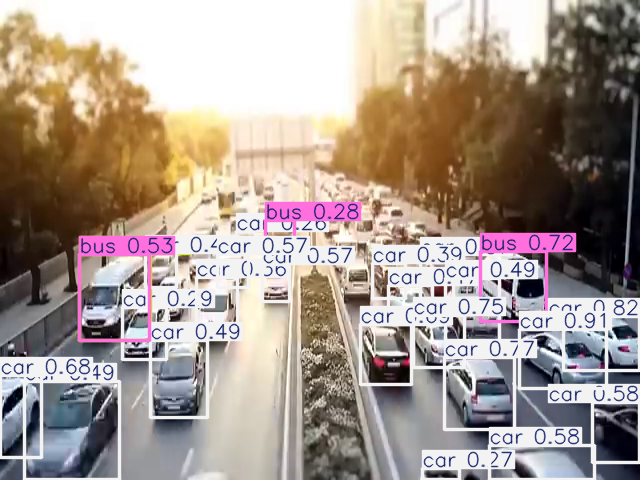

Displaying frame 300...


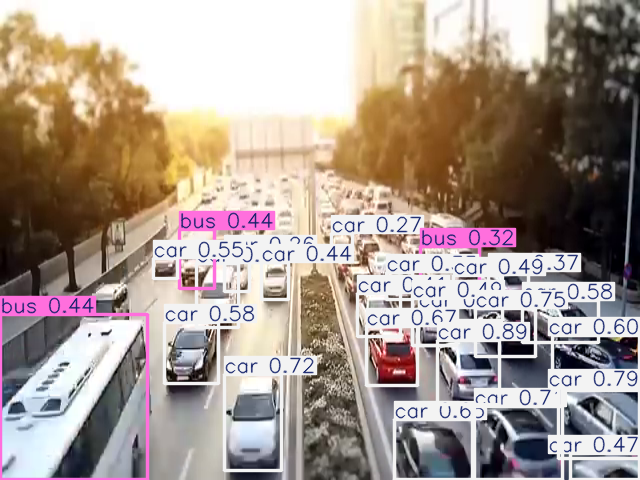

Displaying frame 330...


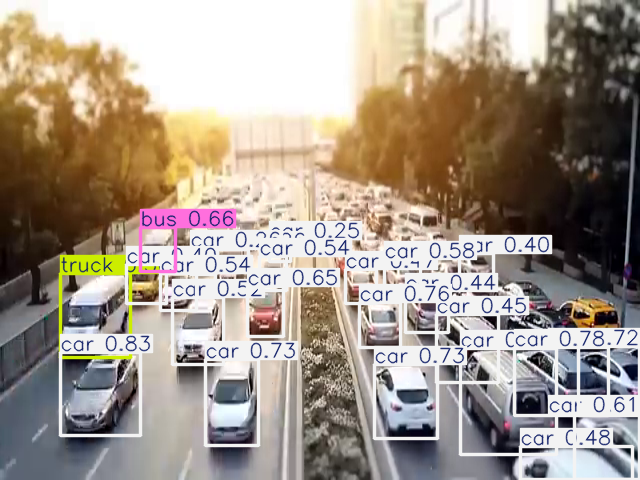

Displaying frame 360...


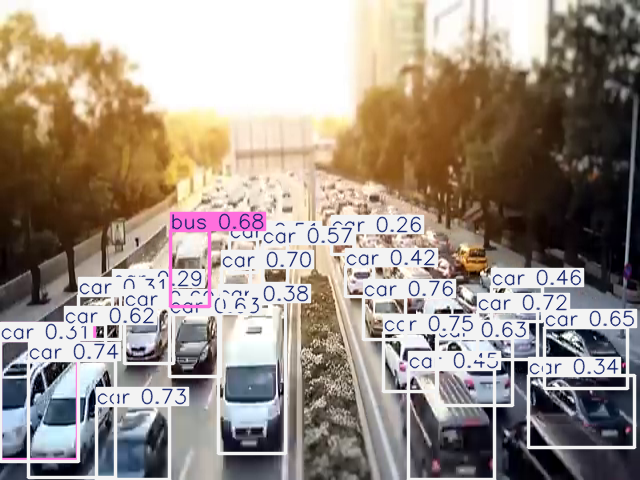

Displaying frame 390...


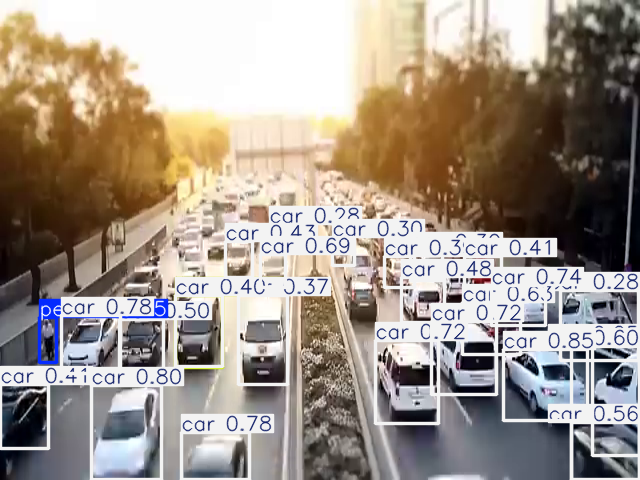

Displaying frame 420...


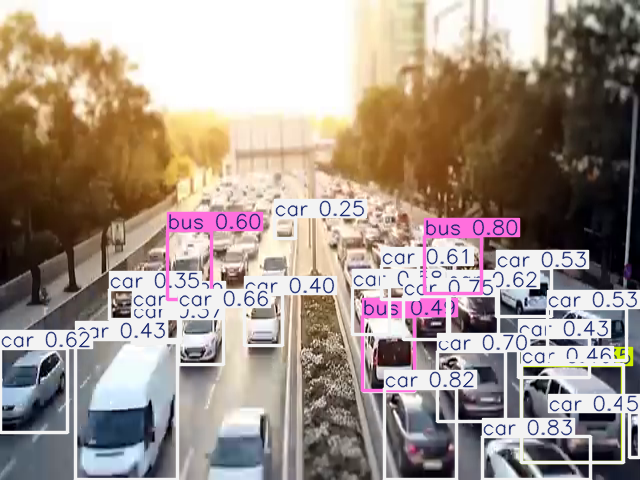

Displaying frame 450...


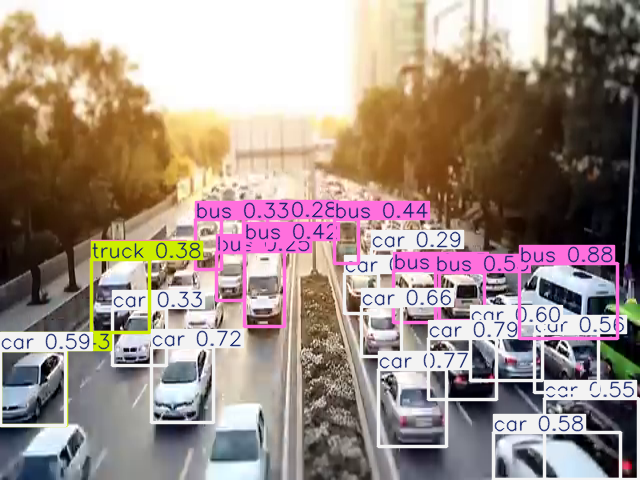

Displaying frame 480...


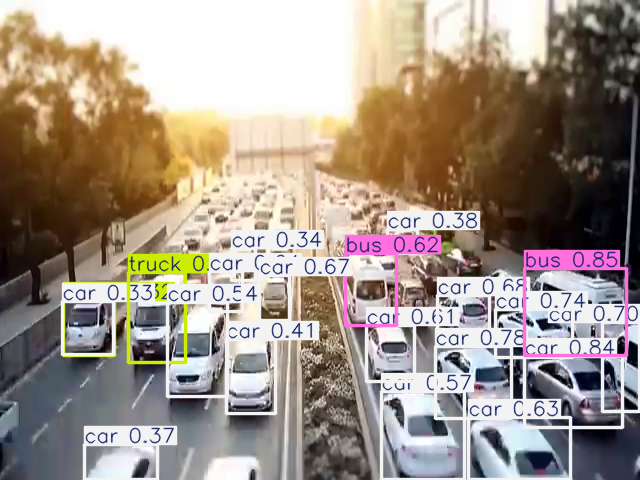

Displaying frame 510...


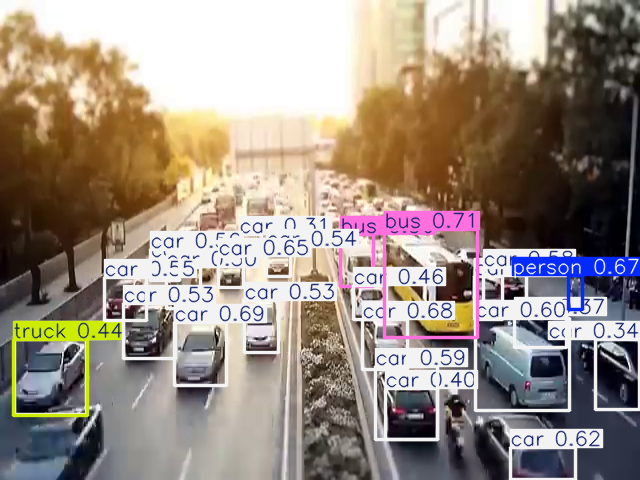

Displaying frame 540...


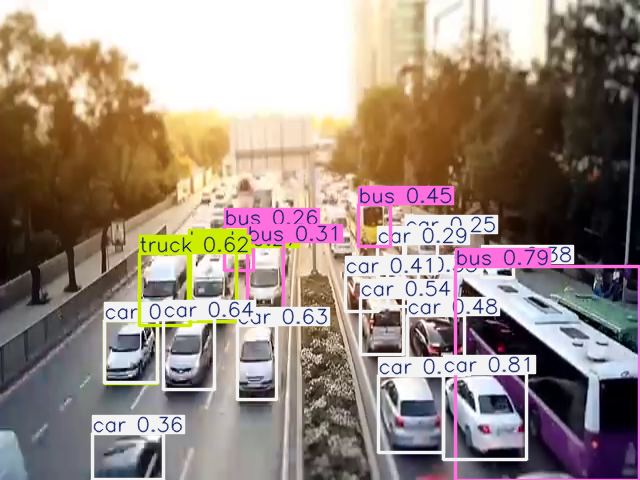

Displaying frame 570...


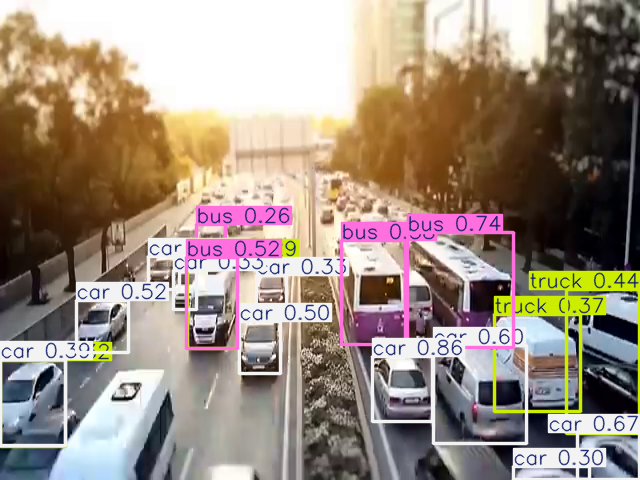

Displaying frame 600...


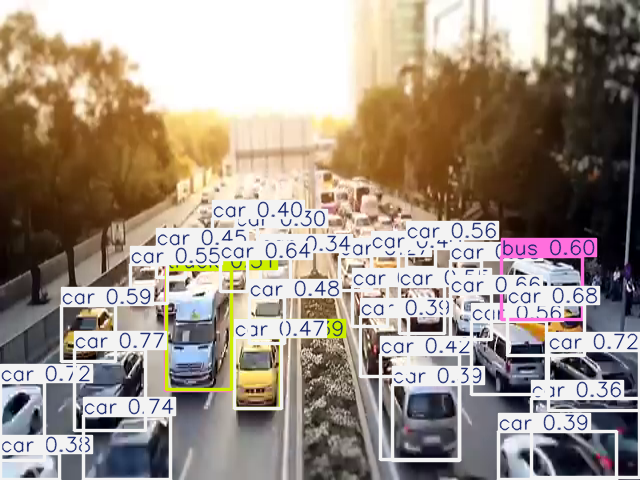

Displaying frame 630...


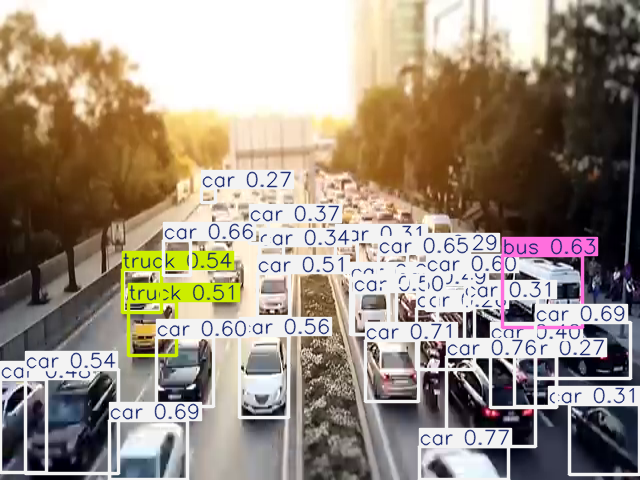

Displaying frame 660...


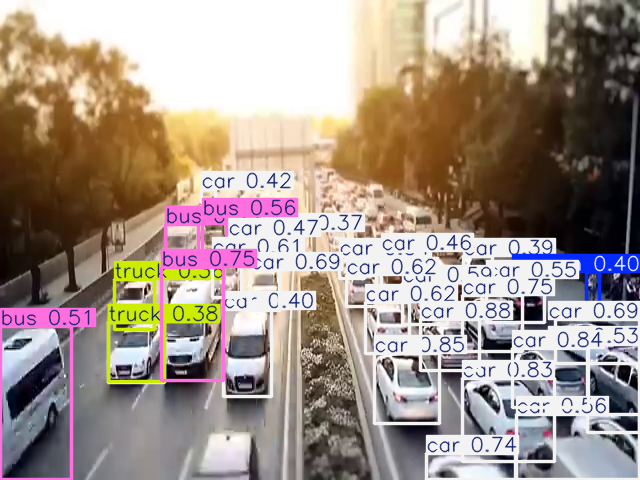

End of video or error reading frame.
Video processing complete.


In [9]:
import cv2
from google.colab.patches import cv2_imshow
from IPython.display import display, Image
import time
import os # For managing file paths if video is uploaded

# Assuming 'model' (your YOLO model) is already loaded, e.g.:
# from ultralytics import YOLO
# model = YOLO("yolov8n.pt") # Or your trained model

# 1. Upload your video file to Colab or provide a direct path
# If your video is in Google Drive, you'll need to mount your drive first:
# from google.colab import drive
# drive.mount('/content/drive')
# video_path = '/content/drive/MyDrive/your_video_folder/your_video.mp4'

# For demonstration, let's assume you've uploaded a video named 'traffic_video.mp4'
# You can upload files using the file explorer icon on the left sidebar in Colab.
video_path = 'traffic_video.mp4' # Or the actual path to your video

# --- Start of Modified Deployment and Visualization ---

cap = cv2.VideoCapture(video_path)

# Check if video opened successfully
if not cap.isOpened():
    print(f"Error: Could not open video file at {video_path}")
    exit()

# We'll collect annotated frames to display them periodically or save them
# For long videos, saving individual frames or creating a new video might be better.
# For short demonstrations, we can display frames in a loop.

print("Processing video... This might take some time depending on video length and model complexity.")

frame_count = 0
display_interval = 30 # Display a frame every 'display_interval' frames (e.g., every 30 frames for ~1 second at 30fps)
output_frames = [] # To store a few frames for display at the end or periodically

while True:
    ret, frame = cap.read()
    if not ret:
        print("End of video or error reading frame.")
        break

    frame_count += 1

    # Resize frame for consistency with model input and display
    # Keep aspect ratio for better visualization if desired
    # frame_width = 640
    # frame_height = int(frame.shape[0] * (frame_width / frame.shape[1]))
    # frame = cv2.resize(frame, (frame_width, frame_height))
    # Or simply fix to 640x480 as in your original code:
    frame = cv2.resize(frame, (640, 480))

    # Perform inference
    results = model(frame, verbose=False)

    # Plot results on the frame
    annotated_frame = results[0].plot()

    # --- Colab-specific display logic ---
    # Instead of cv2.imshow, we'll use cv2_imshow or save and display periodically

    # Option 1: Display every N frames (for live-like viewing in Colab, but not truly real-time)
    if frame_count % display_interval == 0:
        print(f"Displaying frame {frame_count}...")
        cv2_imshow(annotated_frame)
        # Add a small delay to allow the display to update and prevent too many outputs
        # time.sleep(0.05) # Adjust as needed

    # Option 2: Save key frames to display later (useful for long videos)
    # if frame_count % 100 == 0: # Save every 100th frame
    #     cv2.imwrite(f'annotated_frame_{frame_count}.jpg', annotated_frame)
    #     output_frames.append(f'annotated_frame_{frame_count}.jpg')


    # Option 3: Create a new video from annotated frames (recommended for full output)
    # You would initialize a VideoWriter object before the loop and write frames
    # out.write(annotated_frame)

    # In Colab, there's no interactive 'q' key press for cv2.waitKey.
    # You generally let the loop run until the video ends or
    # manually stop the execution cell.
    # if cv2.waitKey(25) & 0xFF == ord('q'): break # This line is ineffective in Colab

cap.release()
# cv2.destroyAllWindows() is not needed/effective in Colab

print("Video processing complete.")

# --- Optional: Display a few collected frames at the end if you used Option 1 or 2 ---
# If you used display_interval, frames would have been shown during processing.
# If you saved specific frames (Option 2), you can display them here:
# for img_path in output_frames:
#     print(f"Displaying saved frame: {img_path}")
#     display(Image(filename=img_path))
#     time.sleep(1) # Pause for 1 second between images

# If you want to download the processed video, you would save it as a new file:
# Example for saving a video (requires initialization before the loop):
# output_video_path = 'output_traffic_monitoring.mp4'
# fourcc = cv2.VideoWriter_fourcc(*'mp4v') # Codec for .mp4
# out = cv2.VideoWriter(output_video_path, fourcc, 20.0, (640, 480)) # Adjust FPS and dimensions

# Inside the loop:
# out.write(annotated_frame)

# After the loop:
# out.release()
# print(f"Processed video saved to {output_video_path}")
